Computational Neuroscience Final Project
Stefano Gentili
Fiammetta Strazzera Perniciani

Here we implement a variational autoencoder trained with MNIST data. Here we take the latent dimension to be equal to 20. At each epoch we save the train and test loss and plot the images generated by random variables in the latent space.
The network is trained by decreasing the parameter alpha of the Adam optimizer over epochs.
The commented sections are the ones that were used for the plots.

In [7]:
from __future__ import print_function
import numpy as np
from scipy.stats import norm
import six
import chainer
from chainer import serializers
import chainer.functions as F
import chainer.links as L
from chainer.functions.loss.vae import gaussian_kl_divergence
from chainer.datasets import TupleDataset
import matplotlib.pyplot as plt

# iterator for the training
class RandomIterator(object):
    """
    Generates random subsets of data
    """

    def __init__(self, data, batch_size=32):
        """
        Args:
            data (TupleDataset):
            batch_size (int):
        Returns:
            list of batches consisting of (input, output) pairs
        """

        self.data = data

        self.batch_size = batch_size
        self.n_batches = len(self.data) // batch_size


    def __iter__(self):

        self.idx = -1
        self._order = np.random.permutation(len(self.data))[:(self.n_batches * self.batch_size)]

        return self

    def next(self):

        self.idx += 1

        if self.idx == self.n_batches:
            raise StopIteration

        i = self.idx * self.batch_size

        # handles unlabeled and labeled data
        if isinstance(self.data, np.ndarray):
            return self.data[self._order[i:(i + self.batch_size)]],self._order
        else:
            return list(self.data[self._order[i:(i + self.batch_size)]]),self._order



def get_mnist(n_train=100, n_test=100, n_dim=1, with_label=True, classes = None):
    """
    :param n_train: nr of training examples per class
    :param n_test: nr of test examples per class
    :param n_dim: 1 or 3 (for convolutional input)
    :param with_label: whether or not to also provide labels
    :param classes: if not None, then it selects only those classes, e.g. [0, 1]
    :return:
    """

    train_data, test_data = chainer.datasets.get_mnist(ndim=n_dim, withlabel=with_label)

    if not classes:
        classes = np.arange(10)
    n_classes = len(classes)

    if with_label:

        for d in range(2):

            if d==0:
                data = train_data._datasets[0]
                labels = train_data._datasets[1]
                n = n_train
            else:
                data = test_data._datasets[0]
                labels = test_data._datasets[1]
                n = n_test

            for i in range(n_classes):
                lidx = np.where(labels == classes[i])[0][:n]
                if i==0:
                    idx = lidx
                else:
                    idx = np.hstack([idx,lidx])

            L = np.concatenate([i*np.ones(n) for i in np.arange(n_classes)]).astype('int32')

            if d==0:
                train_data = TupleDataset(data[idx],L)
            else:
                test_data = TupleDataset(data[idx],L)

    else:

        tmp1, tmp2 = chainer.datasets.get_mnist(ndim=n_dim,withlabel=True)

        for d in range(2):

            if d == 0:
                data = train_data
                labels = tmp1._datasets[1]
                n = n_train
            else:
                data = test_data
                labels = tmp2._datasets[1]
                n = n_test

            for i in range(n_classes):
                lidx = np.where(labels == classes[i])[0][:n]
                if i == 0:
                    idx = lidx
                else:
                    idx = np.hstack([idx, lidx])

            if d == 0:
                train_data = data[idx]
            else:
                test_data = data[idx]

    return train_data, test_data




class VAE(chainer.Chain):
    """Variational AutoEncoder"""

    def __init__(self, n_in, n_latent = 20):
        super(VAE, self).__init__()
        with self.init_scope():
            
            self.n_h = 500
            
            # encoder
            self.enc_l1 = L.Linear(n_in, self.n_h)
            self.enc_b1 = L.BatchNormalization(self.n_h)
            self.enc_l2_mu = L.Linear(self.n_h, n_latent)
            self.enc_b2_mu = L.BatchNormalization(n_latent)
            self.enc_l2_ln_var = L.Linear(self.n_h, n_latent)
            self.enc_b2_ln_var = L.BatchNormalization(n_latent)
            
            # decoder
            self.dec_l1 = L.Linear(n_latent, self.n_h)
            self.dec_b1 = L.BatchNormalization(self.n_h)
            self.dec_l2 = L.Linear(self.n_h, n_in)
            self.dec_b2 = L.BatchNormalization(n_in)

    def __call__(self, x, sigmoid=True):
        """AutoEncoder"""
        return self.decode(self.encode(x)[0], sigmoid)

    def encode(self, x):
        #h1 = self.enc_b1(F.tanh(self.enc_l1(x)))
        h1 = F.tanh(self.enc_l1(x))
        mu = self.enc_l2_mu(h1)
        ln_var = self.enc_l2_ln_var(h1)
        #return self.enc_b2_mu(mu), self.enc_b2_ln_var(ln_var)
        return mu, ln_var

    def decode(self, z, sigmoid=True):
        #h1 = self.dec_b1(F.tanh(self.dec_l1(z)))
        h1 = F.tanh(self.dec_l1(z))
        h2 = self.dec_l2(h1)
        if sigmoid:
            #return F.softmax(self.dec_b2(h2))
            return F.sigmoid(h2)
        else:
            #return self.dec_b2(h2)
            return h2

    def get_loss_func(self):
        
        def lf(x):
            # getting the mu and ln_var of the prior of z with the encoder
            mu, ln_var = self.encode(x)
            batchsize = len(mu.data)
            # creating the latent variable z by sampling from the encoder output
            z = F.gaussian(mu, ln_var)
            # computing the reconstruction loss
            self.rec_loss = F.bernoulli_nll(x, self.decode(z, sigmoid=False)) / batchsize
            #self.rec_loss = F.sigmoid_cross_entropy(x, self.decode(z, sigmoid=False))
            # computing the KL divergence
            self.KL_loss = gaussian_kl_divergence(mu, ln_var) / batchsize
            # computing the total loss
            self.loss = self.rec_loss + self.KL_loss
            # returning the losses separately
            return [self.rec_loss, self.loss]
        return lf




# defining the parameters
n_epochs = 100
input_size = 28

# getting the data
train_set, test_set = get_mnist(n_train = 1600, n_test = 400, n_dim=1)

# creating the model
model = VAE(input_size * input_size, n_latent = 20)

# defining the classifier
classifier = model.get_loss_func()

# creating the vectors to store the training and test loss over epochs
loss_train = np.zeros((n_epochs*4), dtype = float)
loss_test = np.zeros((n_epochs*4), dtype = float)
rec_loss_train = np.zeros((n_epochs*4), dtype = float)
rec_loss_test = np.zeros((n_epochs*4), dtype = float)

# creating template for displaying a 2D manifold of the digits
n = 15  # figure with 15x15 digits
figure = np.zeros((input_size * n, input_size * n))
grid_x = norm.ppf(np.linspace(0.05, 0.95, n))
grid_y = norm.ppf(np.linspace(0.05, 0.95, n))


# creating the optimizer
optimizer = chainer.optimizers.Adam(0.001)
optimizer.setup(model)
# setting weight decay regularization
optimizer.add_hook(chainer.optimizer.WeightDecay(0.0005))

# looping over epochs
for epoch in six.moves.range(n_epochs):
    if epoch == 60:
        optimizer = chainer.optimizers.Adam(0.0001)
        optimizer.setup(model)
        optimizer.add_hook(chainer.optimizer.WeightDecay(0.0005))
        
    # defining the iterator for the training set
    DATA = RandomIterator(train_set)
    
    # looping over batches
    for current_batch in DATA:

        # clearing the gradients
        model.cleargrads()

        # computing the reconstruction training loss and the total training loss
        loss_ = classifier(current_batch[0][0])
        
        # doing the backward step
        loss_[1].backward()

        # updating the optimizer
        optimizer.update()
        
        # saving the reconstruction train loss and the total train loss
        rec_loss_train[epoch] += loss_[0].data
        loss_train[epoch] += loss_[1].data
        
    # computing the reconstruction test loss and the total test loss
    loss_ = classifier(test_set._datasets[0])
    
    # normalizing the train loss
    rec_loss_train[epoch] = rec_loss_train[epoch] / DATA.idx
    loss_train[epoch] = loss_train[epoch] / DATA.idx
    # saving the reconstruction test loss and the total test loss
    rec_loss_test[epoch] = loss_[0].data
    loss_test[epoch] = loss_[1].data

    # Printing the training and test total loss for each epoch
    if epoch % 10 == 0:
        print('In epoch ' + str(epoch + 1) + ' - train loss: ' + str(loss_train[epoch]) + ', test loss: ' + str(loss_test[epoch]))
    
    '''
    # creating latent variables z from the input test images using the encoder
    x = np.reshape(np.array(test_set._datasets[0]),[-1, 1, input_size, input_size])
    mu, var = model.encode(x)
    z = F.gaussian(mu, var)
    
    # if n_latent = 2
    # displaying a scatterplot of the latent variables corresponding to the test images
    fig = plt.figure(figsize=(6, 6))
    plt.scatter(np.array(z.data[:, 0]), np.array(z.data[:, 1]), c = np.array(test_set._datasets[1]))
    plt.xlim(-7.5,7.5)
    plt.ylim(-7.5,7.5)
    plt.xlabel('z1')
    plt.ylabel('z2')
    plt.colorbar()
    plt.text(2.5, 8, 'epoch ' + str(epoch + 1), fontsize=16)
    plt.show()
    
    # if n_latent = 2
    # producing latent variables z in (grid_x)x(grid_y) by applying the inverse of
    # a Gaussian (p(z) is assumed to be Gaussian) to linearly spaced values
    for i, yi in enumerate(grid_x):
        for j, xi in enumerate(grid_y):
            z_sample = np.array([[xi, yi]])
            # sampling an image from the latent variable using the decoder
            x_decoded = model.decode(z_sample.astype('float32'))
            # reshaping the image and saving it 
            digit = x_decoded._data[0].reshape(input_size, input_size)
            figure[i * input_size: (i + 1) * input_size, j * input_size: (j + 1) * input_size] = digit

    fig = plt.figure(figsize = (10, 10))
    plt.imshow(figure, cmap = 'Greys_r')
    plt.show()
    
    # if n_latent != 2
    # displaying a 2D manifold of the digits
    # creating a figure with 2x5 digits
    n1 = 2 
    n2 = 5
    figure = np.zeros((input_size * n1, input_size * n2))
    for digit in six.moves.range(10):
      # using the latent variables samples generated by the encoder
      x_decoded = model.decode(np.array(z.data[digit * 1600 : digit * 1600 + 1, :]))
      img = x_decoded.reshape(input_size, input_size)
      figure[(digit % 2) * input_size: ((digit % 2) + 1) * input_size, (digit % 5) * input_size: ((digit % 5) + 1) * input_size] = img.data

    plt.figure(figsize = (10, 10))
    plt.imshow(figure, cmap = 'Greys_r')
    plt.show()
    '''

# saving the model
#serializers.save_hdf5('', model)

'''
# plotting the train and test loss over epochs
fig = plt.figure(figsize = (15, 5))
plt.subplot(1, 2, 1)
plt.plot(loss_train[0:60], label='train loss',  c='xkcd:tomato')
plt.plot(loss_test[0:60], label='test loss', c='xkcd:crimson')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(prop={'size': 16})
plt.subplot(1, 2, 2)
plt.plot(loss_train[0:60] - rec_loss_train[0:60], label='train KL divergence', c='xkcd:tomato')
plt.plot(loss_test[0:60] - rec_loss_test[0:60], label='test KL divergence', c='xkcd:crimson')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(prop={'size': 16})


# cutting the test images to see how the network performs with corrupted data
digits = [0, 400, 3500] # those indices correspond to the digits 0, 1 and 8 respectively

fig = plt.figure(figsize=(8,8))
for i in range(3):
    x = test_set._datasets[0][digits[i]].reshape(1, input_size * input_size)
    image = model(x)
    image = np.array(image._data[0], dtype='float').reshape(input_size, input_size)
    
    cut = np.array(image, dtype='float32')
    cut[0:14,14:28]=0 #to cut part of the image
    cut_image = model(cut.reshape(1, input_size * input_size))
    
    cut_image = np.array(cut_image._data[0], dtype='float').reshape(input_size, input_size)
    
    plt.subplot(3, 3, 3 * i + 1)
    plt.imshow(image, cmap='gray')
    plt.title('original image')
    plt.subplot(3, 3, 3 * i + 2)
    plt.imshow(cut, cmap='gray')
    plt.title('cut image')
    plt.subplot(3, 3, 3 * i + 3)
    plt.imshow(cut_image, cmap='gray')
    plt.title('reconstructed image')
'''

In epoch 1 - train loss: 159.269207199, test loss: 133.087142944
In epoch 11 - train loss: 112.404723923, test loss: 113.87437439
In epoch 21 - train loss: 108.201105865, test loss: 110.205436707
In epoch 31 - train loss: 106.456464752, test loss: 108.838157654
In epoch 41 - train loss: 105.404904434, test loss: 108.010421753
In epoch 51 - train loss: 104.863844742, test loss: 108.239204407
In epoch 61 - train loss: 101.780267853, test loss: 104.999404907
In epoch 71 - train loss: 101.047560394, test loss: 104.625556946
In epoch 81 - train loss: 100.816697281, test loss: 104.572616577
In epoch 91 - train loss: 100.830271545, test loss: 104.323913574


"\n# plotting the train and test loss over epochs\nfig = plt.figure(figsize = (15, 5))\nplt.subplot(1, 2, 1)\nplt.plot(loss_train[0:60], label='train loss',  c='xkcd:tomato')\nplt.plot(loss_test[0:60], label='test loss', c='xkcd:crimson')\nplt.xlabel('epochs')\nplt.ylabel('loss')\nplt.legend(prop={'size': 16})\nplt.subplot(1, 2, 2)\nplt.plot(loss_train[0:60] - rec_loss_train[0:60], label='train KL divergence', c='xkcd:tomato')\nplt.plot(loss_test[0:60] - rec_loss_test[0:60], label='test KL divergence', c='xkcd:crimson')\nplt.xlabel('epochs')\nplt.ylabel('loss')\nplt.legend(prop={'size': 16})\n\n\n# cutting the test images to see how the network performs with corrupted data\ndigits = [0, 400, 3500] # those indices correspond to the digits 0, 1 and 8 respectively\n\nfig = plt.figure(figsize=(8,8))\nfor i in range(3):\n    x = test_set._datasets[0][digits[i]].reshape(1, input_size * input_size)\n    image = model(x)\n    image = np.array(image._data[0], dtype='float').reshape(input_size, 

The images generated by random variables in the latent space get better over epochs:
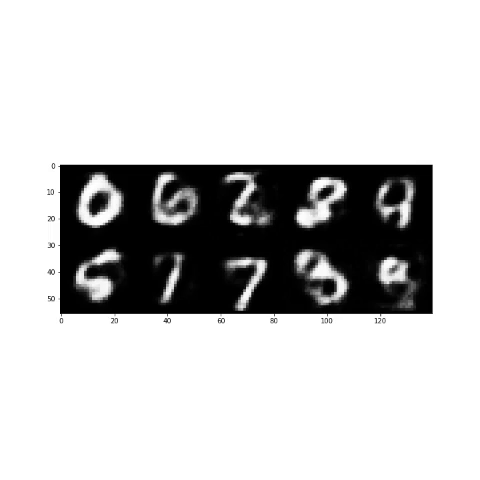

In the case of n_latent = 2, the learning process can be visualized better, thus we show it even if in this case the model does not train as well as the previous case. At each epoch, we save the train and test losses and we plot the latent features generated by the encoder representing the test images, with a different colour for each digit, and the images generated by the decoder from randomly sampled latent variables.


On the left the train and test total loss and on the right the train and test KL divergence are plotted over epochs.

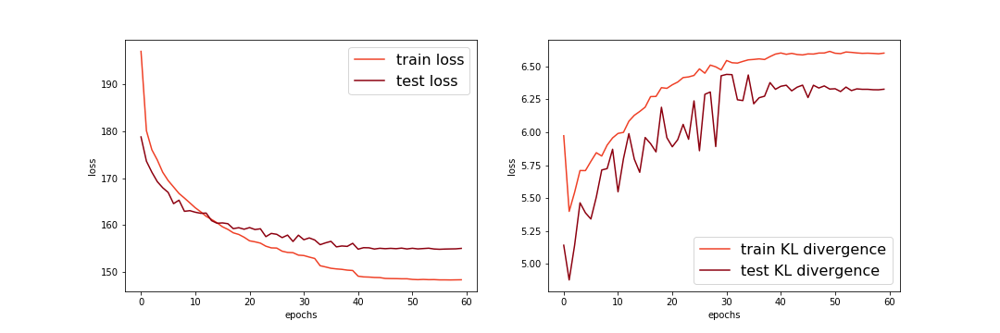

The total loss decreases over epochs, while the KL divergence increases.

The latent variables generated by the encoder representing the test images, with a different colour for each digit, over epochs:
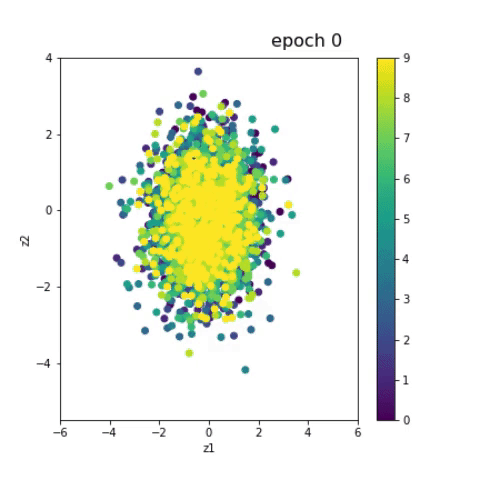

As we can see, the clusters become more separated as the number of epochs increase, meaning that the network is learning to differentiate between the different classes.

The images generated by the decoder from randomly sampled latent variables by applying the inverse of a Gaussian to linearly spaced values:
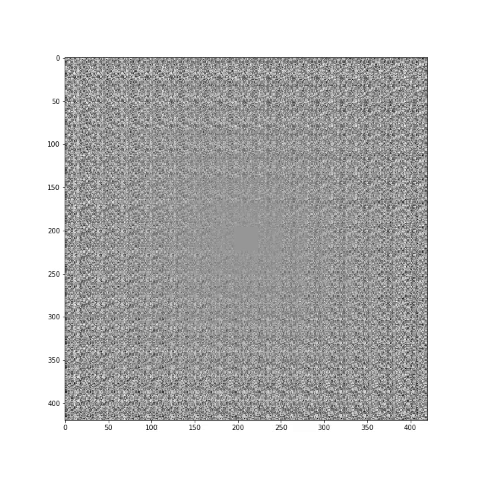

The digits become clearer with increasing number of epochs.

This implementation is robust: if we add noise to the input data, the reconstruction will still be good:

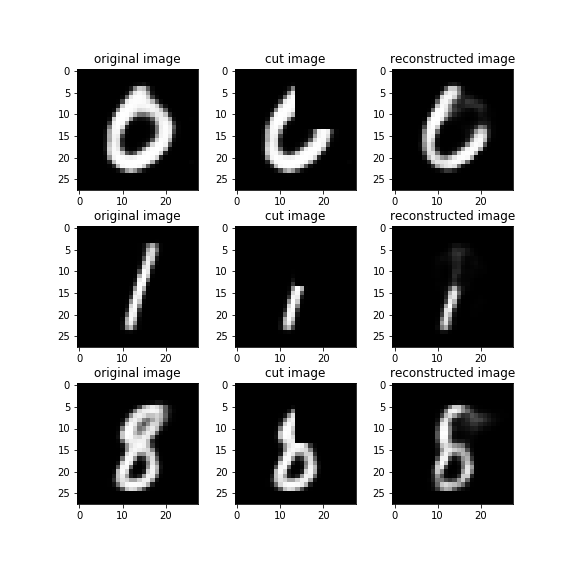

Here we implement a variational autoencoder trained with midi music files, that can be found at: http://www.jsbach.net/midi/midi_solo_lute.html.
To handle midi files and convert them into arrays to feed to the network, we imported the following midi_manipulation.py:

In [ ]:
import midi
import numpy as np


lowerBound = 24
upperBound = 102
span = upperBound-lowerBound


def midiToNoteStateMatrix(midifile, squash=True, span=span):
    pattern = midi.read_midifile(midifile)

    timeleft = [track[0].tick for track in pattern]

    posns = [0 for track in pattern]

    statematrix = []
    time = 0

    state = [[0,0] for x in range(span)]
    statematrix.append(state)
    condition = True
    while condition:
        if time % (pattern.resolution / 4) == (pattern.resolution / 8):
            # Crossed a note boundary. Create a new state, defaulting to holding notes
            oldstate = state
            state = [[oldstate[x][0],0] for x in range(span)]
            statematrix.append(state)
        for i in range(len(timeleft)): #For each track
            if not condition:
                break
            while timeleft[i] == 0:
                track = pattern[i]
                pos = posns[i]

                evt = track[pos]
                if isinstance(evt, midi.NoteEvent):
                    if (evt.pitch < lowerBound) or (evt.pitch >= upperBound):
                        pass
                        # print "Note {} at time {} out of bounds (ignoring)".format(evt.pitch, time)
                    else:
                        if isinstance(evt, midi.NoteOffEvent) or evt.velocity == 0:
                            state[evt.pitch-lowerBound] = [0, 0]
                        else:
                            state[evt.pitch-lowerBound] = [1, 1]
                elif isinstance(evt, midi.TimeSignatureEvent):
                    if evt.numerator not in (2, 4):
                        # We don't want to worry about non-4 time signatures. Bail early!
                        # print "Found time signature event {}. Bailing!".format(evt)
                        out =  statematrix
                        condition = False
                        break
                try:
                    timeleft[i] = track[pos + 1].tick
                    posns[i] += 1
                except IndexError:
                    timeleft[i] = None

            if timeleft[i] is not None:
                timeleft[i] -= 1

        if all(t is None for t in timeleft):
            break

        time += 1

    S = np.array(statematrix)
    statematrix = np.hstack((S[:, :, 0], S[:, :, 1]))
    statematrix = np.asarray(statematrix).tolist()
    return statematrix

def noteStateMatrixToMidi(statematrix, name="example", span=span):
    statematrix = np.array(statematrix)
    if not len(statematrix.shape) == 3:
        statematrix = np.dstack((statematrix[:, :span], statematrix[:, span:]))
    statematrix = np.asarray(statematrix)
    pattern = midi.Pattern()
    track = midi.Track()
    pattern.append(track)
    
    span = upperBound-lowerBound
    tickscale = 55
    
    lastcmdtime = 0
    prevstate = [[0,0] for x in range(span)]
    for time, state in enumerate(statematrix + [prevstate[:]]):  
        offNotes = []
        onNotes = []
        for i in range(span):
            n = state[i]
            p = prevstate[i]
            if p[0] == 1:
                if n[0] == 0:
                    offNotes.append(i)
                elif n[1] == 1:
                    offNotes.append(i)
                    onNotes.append(i)
            elif n[0] == 1:
                onNotes.append(i)
        for note in offNotes:
            track.append(midi.NoteOffEvent(tick=(time-lastcmdtime)*tickscale, pitch=note+lowerBound))
            lastcmdtime = time
        for note in onNotes:
            track.append(midi.NoteOnEvent(tick=(time-lastcmdtime)*tickscale, velocity=40, pitch=note+lowerBound))
            lastcmdtime = time
            
        prevstate = state
    
    eot = midi.EndOfTrackEvent(tick=1)
    track.append(eot)

    midi.write_midifile("{}.midi".format(name), pattern)

And this is the file containing the model and the training algorithm:

In [ ]:
from __future__ import print_function
import numpy as np
import six
import glob
import gc
import midi_manipulation
from tqdm import tqdm

import chainer
import chainer.functions as F
import chainer.links as L
from chainer.functions.loss.vae import gaussian_kl_divergence
from chainer import serializers

import matplotlib.pyplot as plt


class RandomIterator(object):
    """
    Generates random subsets of data
    """

    def __init__(self, data, batch_size=32):
        """

        Args:
            data (TupleDataset):
            batch_size (int):

        Returns:
            list of batches consisting of (input, output) pairs
        """

        self.data = data

        self.batch_size = batch_size
        self.n_batches = len(self.data) // batch_size


    def __iter__(self):

        self.idx = -1
        self._order = np.random.permutation(len(self.data))[:(self.n_batches * self.batch_size)]

        return self

    def next(self):

        self.idx += 1

        if self.idx == self.n_batches:
            raise StopIteration

        i = self.idx * self.batch_size

        # handles unlabeled and labeled data
        if isinstance(self.data, np.ndarray):
            
            return self.data[self._order[i:(i + self.batch_size)]],self._order
        else:
            return list(self.data[self._order[i:(i + self.batch_size)]]),self._order



class VAE(chainer.Chain):
    """Variational AutoEncoder"""

    def __init__(self, n_in, n_latent = 20):
        super(VAE, self).__init__()
        with self.init_scope():
            self.n_h1 = 1000
            self.n_h2 = 500
            self.n_h3 = 100
            # encoder
            self.le1 = L.Linear(n_in, self.n_h1)
            self.le2 = L.Linear(self.n_h1, self.n_h2)
            self.le3 = L.Linear(self.n_h2, self.n_h3)
            self.le_mu = L.Linear(self.n_h3, n_latent)
            self.le_ln_var = L.Linear(self.n_h3, n_latent)
            # decoder
            self.ld1 = L.Linear(n_latent, self.n_h3)
            self.ld2 = L.Linear(self.n_h3, self.n_h2)
            self.ld3 = L.Linear(self.n_h2, n_in)

    def __call__(self, x, sigmoid=True):
        """AutoEncoder"""
        return self.decode(self.encode(x)[0], sigmoid)

    def encode(self, x):
        h1 = F.relu(self.le1(x))
        h1 = F.relu(self.le2(h1))
        h1 = F.relu(self.le3(h1))
        mu = self.le_mu(h1)
        ln_var = self.le_ln_var(h1)
        return mu, ln_var

    def decode(self, z, sigmoid=True):
        h1 = F.relu(self.ld1(z))
        h1 = F.relu(self.ld2(h1))
        h2 = self.ld3(h1)
        if sigmoid:
            return F.sigmoid(h2)
        else:
            return h2

    def get_loss_func(self):
        def lf(x):
            # getting the mu and ln_var of the prior of z with the encoder
            mu, ln_var = self.encode(x)
            batchsize = len(mu.data)
            # creating the latent variable z by sampling from the encoder output
            z = F.gaussian(mu, ln_var)
            # computing the reconstruction loss
            self.rec_loss = F.bernoulli_nll(x, self.decode(z, sigmoid=False)) / batchsize
            #self.rec_loss = F.sigmoid_cross_entropy(x, self.decode(z, sigmoid=False))
            # computing the KL divergence
            self.KL_loss = gaussian_kl_divergence(mu, ln_var) / batchsize
            # computing the total loss
            self.loss = self.rec_loss + self.KL_loss
            # returning the losses separately
            return [self.rec_loss, self.loss]
        return lf


genres = {'ebmajor', 'cminor'}
songs = []

samplespersong = 200
timesteps = 100
freqs = 156
batchsize=64
n_epochs= 100

# Prepare the dataset
# the midi files have to be in a folder 'data/*', where * is the genre (or class) name
# where data in is the same folder of the script
for genre in genres:
    songsgenre = []
    files = glob.glob('data/' + genre + '/*.mid')
    for f in tqdm(files):
        song = np.array(midi_manipulation.midiToNoteStateMatrix(f))
        #song = np.reshape(song, [1, -1])
        songsgenre.append(song)
    songs.append(songsgenre)


genre=0
n_traingenre = int(samplespersong * len(songs[genre]) * 4 / 5)
n_testgenre = int(samplespersong * len(songs[genre]) * 1 / 5)
#train = np.zeros((len(genres) * n_traingenre, args.freqs * args.timesteps))
#test = np.zeros((len(genres) * n_testgenre, args.freqs * args.timesteps))
train = np.zeros((len(genres) * n_traingenre, 1, timesteps, freqs))
test = np.zeros((len(genres) * n_testgenre, 1, timesteps, freqs))
for genre in range(len(genres)):
    #DATAgenre = np.zeros((args.samplespersong * len(songs[genre]), args.freqs * args.timesteps))
    DATAgenre = np.zeros((samplespersong * len(songs[genre]), timesteps, freqs))
    for song in range(len(songs[genre])):
        gc.collect()
        #overlap = (songs[genre][song].size - args.freqs * args.timesteps) / args.samplespersong
        overlap = (songs[genre][song].shape[0] - timesteps) / samplespersong
        #app = [songs[genre][song][0][i * overlap : i * overlap + args.timesteps * args.freqs] for i in range(args.samplespersong)]
        app = [songs[genre][song][i * overlap : i * overlap + timesteps] for i in range(samplespersong)]
        app = np.array(app)
        #DATAgenre[song * args.samplespersong : (song + 1) * args.samplespersong, :] = app #[random.sample(range(len(app)), min - n_freqs * n_timesteps)]
        DATAgenre[song * samplespersong : (song + 1) * samplespersong, :, :] = app #[random.sample(range(len(app)), min - n_freqs * n_timesteps)]
    DATAgenre = np.random.permutation(DATAgenre) # shuffle along first index
    train[genre * n_traingenre : (genre + 1) * n_traingenre, 0, :, :] = DATAgenre[0 : n_traingenre, :, :]
    test[genre * n_testgenre : (genre + 1) * n_testgenre, 0, :, :] = DATAgenre[n_traingenre : n_traingenre + n_testgenre, :, :]



# initializing the variables to store the loss over epochs
loss_train = np.zeros((n_epochs), dtype = float)
loss_test = np.zeros((n_epochs), dtype = float)
rec_loss_train = np.zeros((n_epochs), dtype = float)
rec_loss_test = np.zeros((n_epochs), dtype = float)

# Creating the model
model = VAE(timesteps * freqs)

# creating the classifier
classifier = model.get_loss_func()

# creating the optimizer
optimizer = chainer.optimizers.Adam(alpha=0.0005)
optimizer.setup(model)
optimizer.add_hook(chainer.optimizer.WeightDecay(0.0005))


for epoch in six.moves.range(10, 30):

    DATA = RandomIterator(train.astype('float32'))
    for current_batch in DATA:

        # Clearing the gradients
        model.cleargrads()

        # Computing the loss
        loss_ = classifier(current_batch[0].reshape(-1, timesteps * freqs).astype('float32'))
        #loss_ = classifier(current_batch[0])

        loss_[1].backward()

        optimizer.update()

        loss_train[epoch] += loss_[1].data 
        rec_loss_train[epoch] += loss_[0].data 
        

    loss_ = classifier(test.reshape(-1, timesteps * freqs).astype('float32'))
    #loss_ = classifier(test.astype('float32'))
    
    # normalizing the train loss
    rec_loss_train[epoch] = rec_loss_train[epoch] / DATA.idx
    loss_train[epoch] = loss_train[epoch] / DATA.idx
    rec_loss_test[epoch] = loss_[0].data
    loss_test[epoch] = loss_[1].data

    # Printing the accuracy for each epoch
    print('In epoch ' + str(epoch + 1) + ' - train loss: ' + str(loss_train[epoch]) + ', test loss: ' + str(loss_test[epoch]))


  
# plotting the loss
fig = plt.figure(figsize = (15, 5))
plt.subplot(1, 2, 1)
plt.plot(loss_train[1:60], label='train loss',  c='xkcd:tomato')
plt.plot(loss_test[1:60], label='test loss', c='xkcd:crimson')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(prop={'size': 16})
plt.subplot(1, 2, 2)
plt.plot(loss_train[1:60] - rec_loss_train[1:60], label='train KL divergence', c='xkcd:tomato')
plt.plot(loss_test[1:60] - rec_loss_test[1:60], label='test KL divergence', c='xkcd:crimson')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(prop={'size': 16})
fig.savefig('C:\Users\Fiammetta\Documents\CNS\ComputationalCognitiveNeuroscience\project\plots\midi\Adam\loss.png')

# generate song
# from test sample:
sample = 5
x = model(test[5, :, :, :].reshape([1, timesteps*freqs]).astype('float32'))
# or from randomly sampled z
n_examples = 1
z = chainer.Variable(
    np.random.normal(0, 1, (n_examples, 20)).astype(np.float32))
# z=np.float32(np.reshape(song[160:260, :], [1, 15600]))
x = model.decode(z)
# convert to midi
generated_song = np.reshape(x.data, [timesteps, freqs])
generated_song = (generated_song>0.2)*1
#save generated midi
midi_manipulation.noteStateMatrixToMidi(generated_song)


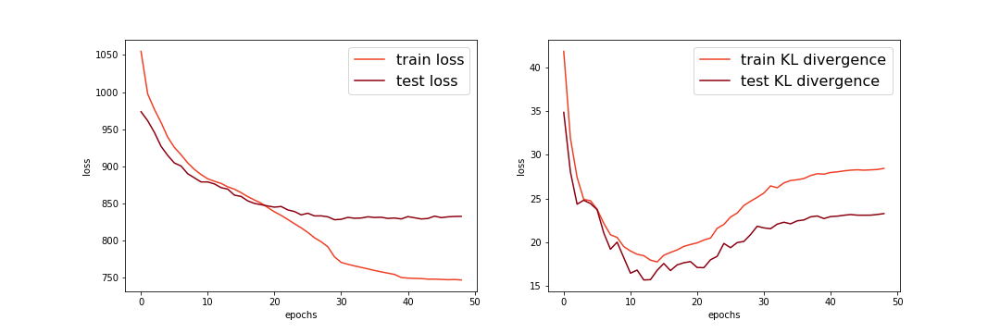

In order to attach the files here, we converted them to mp3 format. An example of the input data is:

In [1]:
from IPython.display import *
Audio("C:\Users\Fiammetta\Documents\CNS\ComputationalCognitiveNeuroscience\project\data\cminor\997-1pre.mp3", autoplay=False)

Two examples of midi files that the VAE generated from randomly sampled variables in the latent space:

In [3]:
from IPython.display import *
Audio("C:\Users\Fiammetta\Documents\CNS\ComputationalCognitiveNeuroscience\project\generatedmusic\g1.mp3", autoplay=False)


In [4]:
Audio("C:\Users\Fiammetta\Documents\CNS\ComputationalCognitiveNeuroscience\project\generatedmusic\g3.mp3", autoplay=False)

Additionally, we tried to train on midi versions of songs from different genres (Blues, Jazz, Disco, Rock), taken from: https://freemidi.org/.
Interestingly, when training only on two songs of two VERY different genres - Purple Haze by Jimi Hendrix and Baby by Justin Bieber -, the VAE seems to recognize this difference, as can be seen from the feature space:

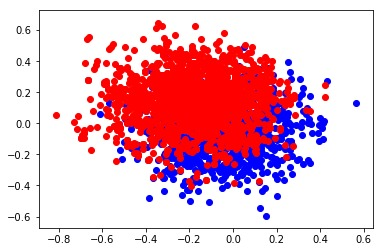